# 🛡️ Machine Learning para Antivírus: da Regra Heurística ao LightGBM
**Disciplina:** IA e MACHINE LEARNING SECURITY
**Objetivo:** Construir um pipeline completo de Machine Learning para detecção de malware em memória RAM (análise forense Volatility), comparando regras heurísticas com modelos de árvore (Decision Tree, Random Forest e LightGBM).

---


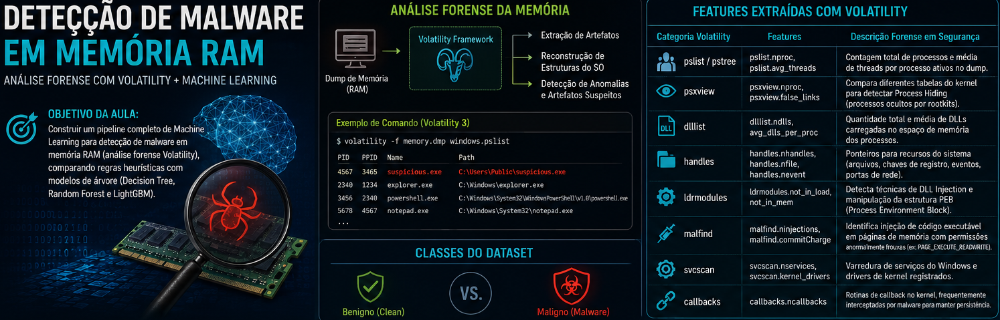

# FLUXO

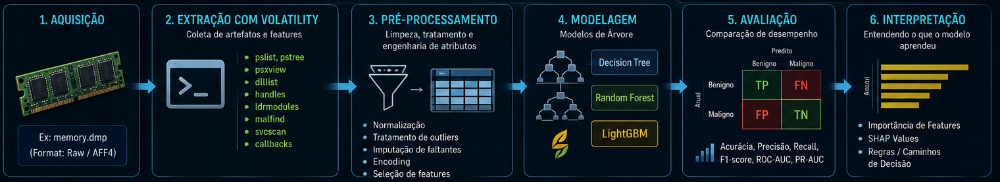

## 1. Configuração do Ambiente e Instalação de Bibliotecas

Nesta etapa, instalamos e importamos as bibliotecas necessárias para manipulação de dados, modelagem preditiva e visualização estatística.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
# Importação corrigida das métricas do Scikit-Learn
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    classification_report,  # Substituído para a função correta
    roc_curve
)
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb

import warnings
warnings.filterwarnings('ignore')

# Set aesthetic visual parameters for seaborn
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (10, 6)
print("Environment initialized successfully!")

Environment initialized successfully!


## 2. Carregamento do Dataset CIC-MalMem-2022 e Dicionário de Features

O dataset **CIC-MalMem-2022** (Canadian Institute for Cybersecurity) simula um ambiente real de análise forense de memória RAM. Ele foi criado extraindo artefatos de memória de amostras benignas e maliciosas (escondidas/ofuscadas) utilizando o framework **Volatility**.

O dataset contém **58.596 registros** divididos equilibradamente entre 29.298 amostras Benignas e 29.298 Maliciosas (Spyware, Ransomware, Trojan).

### Dicionário Forense de Features (Memory Analysis via Volatility)

| Categoria Volatility | Nome da Feature | Descrição Forense em Segurança |
| :--- | :--- | :--- |
| **pslist / pstree** | `pslist.nproc`, `pslist.nppid`, `pslist.avg_threads` | Contagem total de processos, PPIDs distintos observados e média de threads por processo ativos no dump. |
| **psxview** | `psxview.nproc`, `psxview.false_links` | Compara diferentes tabelas do kernel para detectar **Process Hiding** (processos ocultos por rootkits). |
| **dlllist** | `dlllist.ndlls`, `avg_dlls_per_proc` | Quantidade total e média de DLLs carregadas no espaço de memória dos processos. |
| **handles** | `handles.nhandles`, `handles.nfile`, `handles.nevent` | Ponteiros para recursos do sistema (arquivos, chaves de registro, eventos, portas de rede). |
| **ldrmodules** | `ldrmodules.not_in_load`, `not_in_mem` | Verifica se existem DLLs carregadas no processo que não aparecem corretamente nas listas mantidas pelo sistema operacional. Isso pode indicar injeção de DLLs ou tentativas de ocultar módulos maliciosos, alterando estruturas internas do Windows como o PEB (Process Environment Block). |
| **malfind** | `malfind.ninjections`, `malfind.commitCharge` | Identifica injeção de código executável em páginas de memória com permissões anormalmente frouxas (ex: `PAGE_EXECUTE_READWRITE`). |
| **svcscan** | `svcscan.nservices`, `svcscan.kernel_drivers` | Varredura de serviços do Windows e drivers de kernel registrados. |
| **callbacks** | `callbacks.ncallbacks` | Rotinas de callback no kernel, frequentemente interceptadas por malware para manter persistência. |


In [2]:
import os
import pandas as pd

def load_dataset():
    """
    Load the Obfuscated-MalMem2022.csv dataset.

    The function first checks whether a local copy is available.
    If not, it loads the dataset directly from GitHub.
    """

    # Local path used when the dataset has already been downloaded
    local_path = "Obfuscated-MalMem2022.csv"

    # Raw GitHub URL
    github_url = (
        "https://raw.githubusercontent.com/"
        "mateusdalbone-fiap/IA_MACHINE_LEARNING_SECURITY/"
        "main/datasets/Obfuscated-MalMem2022.csv"
    )

    # Prefer local copy when available
    if os.path.exists(local_path):
        print(f"Loading local dataset from: {local_path}")
        df = pd.read_csv(local_path)
    else:
        print("Local dataset not found.")
        print("Loading dataset from GitHub...")
        df = pd.read_csv(github_url)

    return df


# Load dataset
raw_df = load_dataset()

print(f"Dataset shape: {raw_df.shape[0]} rows and {raw_df.shape[1]} columns.")
display(raw_df.head())

Local dataset not found.
Loading dataset from GitHub...
Dataset shape: 10000 rows and 15 columns.


,pslist.nproc,pslist.nppid,pslist.avg_threads,dlllist.ndlls,dlllist.avg_dlls_per_proc,handles.nhandles,handles.avg_handles_per_proc,ldrmodules.not_in_load,ldrmodules.not_in_init,ldrmodules.not_in_mem,malfind.ninjections,malfind.commitCharge,psxview.not_in_pslist,callbacks.ncallbacks,Class
0,81,10,9.315280,1930,57.833104,12263,133.876143,7,1,2,1,14,0,88,Benign
1,44,15,20.101339,4753,39.434898,12050,151.365878,9,6,3,6,37,2,44,Malware
2,90,22,24.159313,4665,13.251923,21080,371.795065,6,5,2,5,31,2,63,Malware
3,50,20,10.131803,4475,34.644528,26645,437.391979,1,8,2,0,44,2,75,Benign
4,53,19,30.812920,1827,59.637564,18057,180.579983,4,6,3,6,28,2,87,Malware


In [3]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   pslist.nproc                  10000 non-null  int64  
 1   pslist.nppid                  10000 non-null  int64  
 2   pslist.avg_threads            10000 non-null  float64
 3   dlllist.ndlls                 10000 non-null  int64  
 4   dlllist.avg_dlls_per_proc     10000 non-null  float64
 5   handles.nhandles              10000 non-null  int64  
 6   handles.avg_handles_per_proc  10000 non-null  float64
 7   ldrmodules.not_in_load        10000 non-null  int64  
 8   ldrmodules.not_in_init        10000 non-null  int64  
 9   ldrmodules.not_in_mem         10000 non-null  int64  
 10  malfind.ninjections           10000 non-null  int64  
 11  malfind.commitCharge          10000 non-null  int64  
 12  psxview.not_in_pslist         10000 non-null  int64  
 13  ca

## 3. Análise Exploratória de Dados (EDA) e Pré-processamento

Analisamos a distribuição da classe alvo, tratamos colunas categóricas e preparamos os vetores de atributos $X$ e a variável resposta $y$.


In [10]:
# Display first rows
raw_df.head(20)


,pslist.nproc,pslist.nppid,pslist.avg_threads,dlllist.ndlls,dlllist.avg_dlls_per_proc,handles.nhandles,handles.avg_handles_per_proc,ldrmodules.not_in_load,ldrmodules.not_in_init,ldrmodules.not_in_mem,malfind.ninjections,malfind.commitCharge,psxview.not_in_pslist,callbacks.ncallbacks,Class
0,81,10,9.315280,1930,57.833104,12263,133.876143,7,1,2,1,14,0,88,Benign
1,44,15,20.101339,4753,39.434898,12050,151.365878,9,6,3,6,37,2,44,Malware
2,90,22,24.159313,4665,13.251923,21080,371.795065,6,5,2,5,31,2,63,Malware
3,50,20,10.131803,4475,34.644528,26645,437.391979,1,8,2,0,44,2,75,Benign
4,53,19,30.812920,1827,59.637564,18057,180.579983,4,6,3,6,28,2,87,Malware
5,32,25,20.960404,3184,29.370136,14382,267.334898,7,9,4,4,39,1,95,Malware
6,51,36,17.328255,4304,39.694062,12870,347.766814,6,9,2,2,29,1,72,Benign
7,82,35,23.061610,3162,15.331838,22726,418.510536,5,1,0,5,10,0,32,Malware
8,31,33,24.048611,2275,17.059025,23038,351.278644,13,2,2,2,27,1,60,Malware
9,59,32,6.283498,2516,53.734073,9753,138.170368,9,2,0,2,1,0,33,Malware


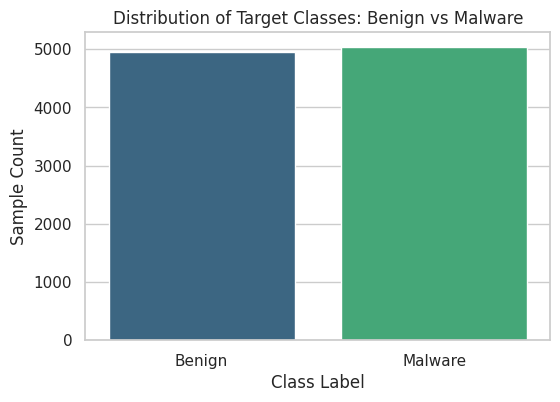

Class
Malware    0.5041
Benign     0.4959
Name: proportion, dtype: float64


In [6]:
# Visualize class balance
plt.figure(figsize=(6, 4))
sns.countplot(data=raw_df, x='Class', palette='viridis')
plt.title('Distribution of Target Classes: Benign vs Malware')
plt.xlabel('Class Label')
plt.ylabel('Sample Count')
plt.show()

print(raw_df['Class'].value_counts(normalize=True))


In [7]:
# Binary target encoding: Benign -> 0, Malware -> 1
df_processed = raw_df.copy()

if df_processed['Class'].dtype == 'object':
    df_processed['Target'] = df_processed['Class'].map({'Benign': 0, 'Malware': 1})
    df_processed.drop(columns=['Class'], inplace=True)

if 'Category' in df_processed.columns:
    df_processed.drop(columns=['Category'], inplace=True)

# Check missing values
missing_count = df_processed.isnull().sum().sum()
print(f"Total missing values: {missing_count}")

X = df_processed.drop(columns=['Target'])
y = df_processed['Target']

print(f"Features matrix shape: {X.shape}")
print(f"Target vector shape: {y.shape}")


Total missing values: 0
Features matrix shape: (10000, 14)
Target vector shape: (10000,)


## 4. Divisão em Treino, Validação e Teste

Para garantir a confiabilidade na avaliação do antivírus, dividimos os dados em três conjuntos estritamente separados:
* **Treino (70%):** Utilizado para ajustar os parâmetros dos modelos.
* **Validação (15%):** Utilizado para sintonia de hiperparâmetros e comparação intermediária.
* **Teste (15%):** Simulador de ambiente de produção real (dados não vistos).


In [8]:
# Stratified train / temporary split (70% train, 30% temp)
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.30, random_state=42, stratify=y
)

# Stratified temp split into Validation (15%) and Test (15%)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.50, random_state=42, stratify=y_temp
)

print(f"Training set:   {X_train.shape[0]} samples ({y_train.mean():.1%} malware)")
print(f"Validation set: {X_val.shape[0]} samples ({y_val.mean():.1%} malware)")
print(f"Test set:       {X_test.shape[0]} samples ({y_test.mean():.1%} malware)")


Training set:   7000 samples (50.4% malware)
Validation set: 1500 samples (50.4% malware)
Test set:       1500 samples (50.4% malware)


## 5. Modelo Baseline: Antivírus Baseado em Regras Heurísticas

Antivírus tradicionais (legados) utilizam regras estáticas condicionais. Aqui construímos uma regra simples baseada na presença de injeção de código na memória (`malfind.ninjections > 0`) ou desalinhamento de DLLs (`ldrmodules.not_in_load > 2`).


In [11]:
def baseline_rule_antivirus(df_features):
    """
    Simple static heuristic rule
    """

    # TODO: Crie uma regra simples para classificar cada processo como
    # "Benign" ou "Malware" usando features do df_features.
    #
    # Dica:
    # - Escolha uma ou mais features forenses
    #   (ex: 'malfind.ninjections', 'ldrmodules.not_in_load')
    # - Defina critérios usando operadores
    #   (ex: >, <, ==, !=, >=, <=)
    # - Combine os critérios com operadores lógicos
    #   (ex: & = AND, | = OR)
    #
    # Exemplo conceitual:
    # "Se houver muitas injeções OU módulos fora da lista de carregamento,
    # classifique como Malware."
    predictions = (
        (df_features['malfind.ninjections'] > 0) |
        (df_features['ldrmodules.not_in_load'] > 2)
    ).astype(int)
    return predictions


#### Revocação (Recall) vs. Precisão

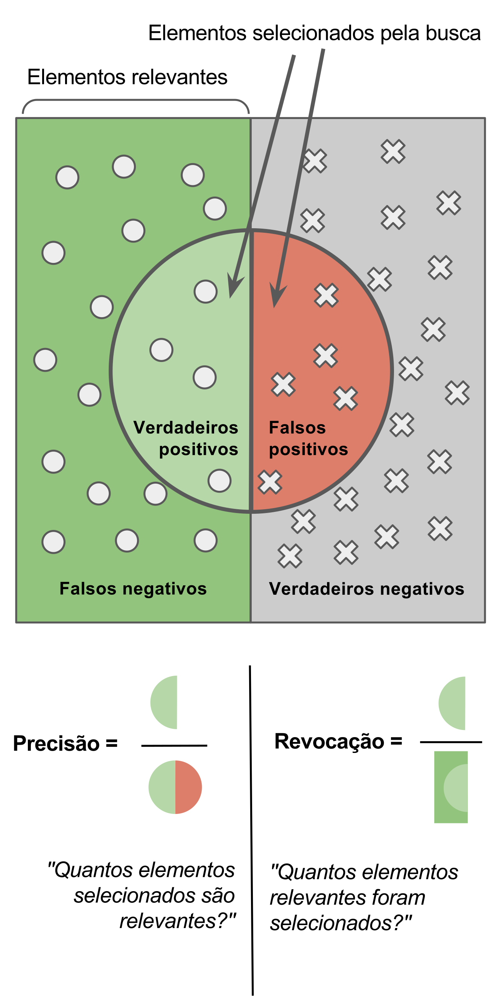

In [12]:
# Predict on validation set
y_pred_baseline = baseline_rule_antivirus(X_val)

acc_base = accuracy_score(y_val, y_pred_baseline)
prec_base = precision_score(y_val, y_pred_baseline)
rec_base = recall_score(y_val, y_pred_baseline)
f1_base = f1_score(y_val, y_pred_baseline)

print("=== BASELINE HEURISTIC ANTIVIRUS PERFORMANCE ===")
print(f"Accuracy:  {acc_base:.4f}")
print(f"Precision: {prec_base:.4f}")
print(f"Recall:    {rec_base:.4f}")
print(f"F1-Score:  {f1_base:.4f}")

=== BASELINE HEURISTIC ANTIVIRUS PERFORMANCE ===
Accuracy:  0.6007
Precision: 0.5579
Recall:    1.0000
F1-Score:  0.7162


## 6. Modelo 1: Árvore de Decisão (Decision Tree)

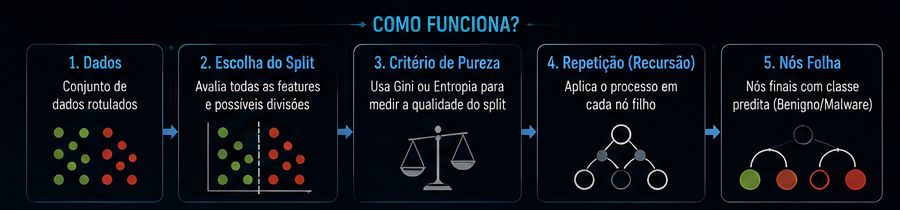

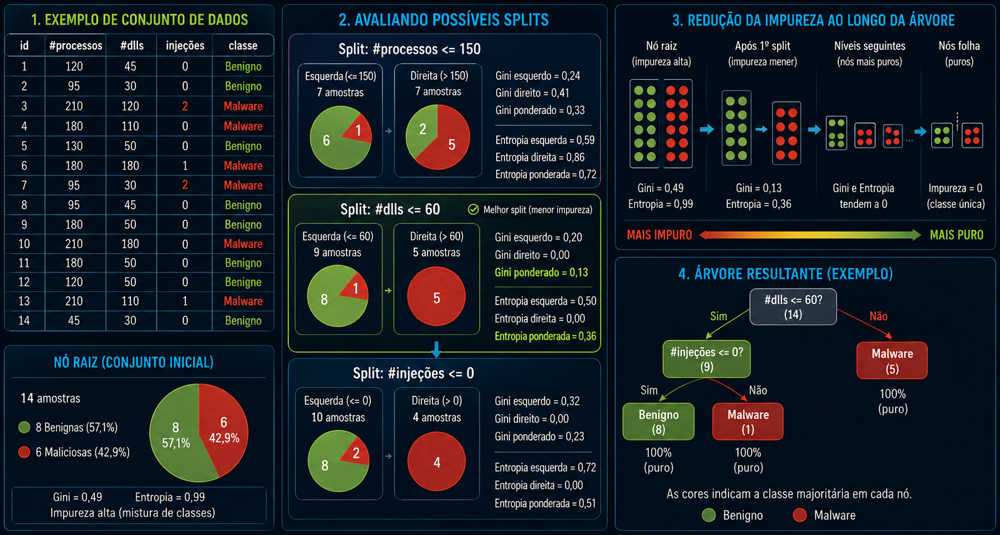

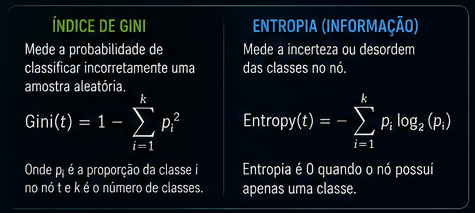

A **Árvore de Decisão** constrói regras de divisão hierárquica baseadas no índice de Gini ou Entropia.

Ela é altamente interpretável, pois nos permite visualizar o fluxograma de decisão exato utilizado pelo antivírus.


In [ ]:
# TODO Inicializar e treinar o classificador Decision Tree
# configurando:
# - max_depth para limitar a profundidade máxima da árvore
# e ajudar a controlar o overfitting.
#  -criterion='gini' para definir o critério utilizado para avaliar a qualidade dos splits.
dt_model = DecisionTreeClassifier(...)

# TODO Treine a árvore utilizando .fit e os dados de treinamento X_train, y_train
...

# TODO Faça as previsões no conjunto de validação X_val usando predict() para
# retornar a classe prevista para cada amostra
y_pred_dt = ...

# TODO Obtenha as probabilidades previstas para cada classe usando predict_proba
# nos dados X_val e depois usando [:, 1] para selecionar a
# probabilidade da classe positiva (Malware)
y_prob_dt = ...


In [ ]:
print("=== DECISION TREE PERFORMANCE (VALIDATION) ===")
print(f"Accuracy:  {accuracy_score(y_val, y_pred_dt):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_dt):.4f}")
print(f"Recall:    {recall_score(y_val, y_pred_dt):.4f}")
print(f"F1-Score:  {f1_score(y_val, y_pred_dt):.4f}")
print(f"ROC-AUC:   {roc_auc_score(y_val, y_prob_dt):.4f}")


In [ ]:
# Plot decision tree diagram
plt.figure(figsize=(18, 8))
plot_tree(
    dt_model,
    feature_names=X.columns,
    class_names=['Benign', 'Malware'],
    filled=True,
    rounded=True,
    fontsize=9
)
plt.title("Learned Decision Rules for Malware Detection (Decision Tree)")
plt.show()


#### Trade-off viés-variância

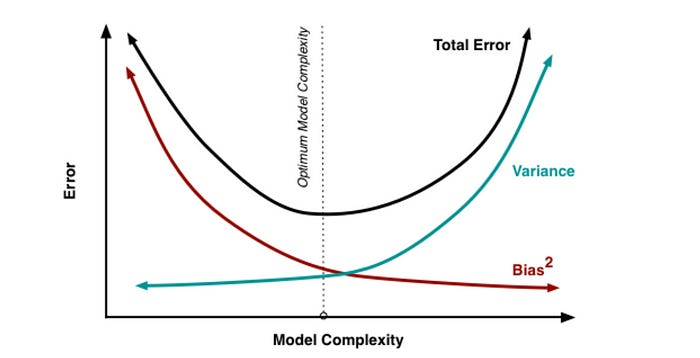

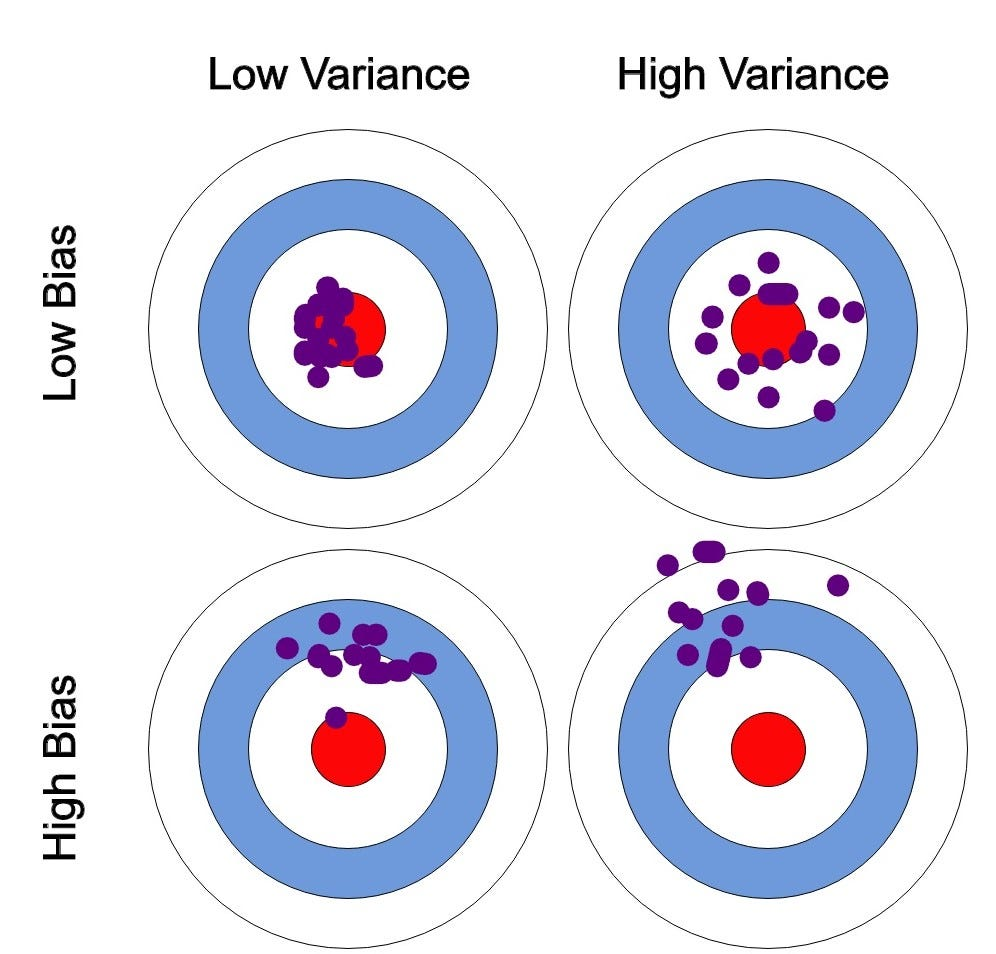

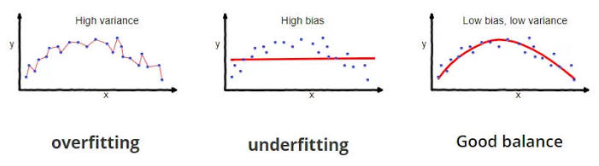

- **Bias:** mede o quão longe, em média, as previsões estão do valor correto.

- **Variance:** mede o quanto as previsões variam entre diferentes treinamentos.

## 7. Modelo 2: Random Forest (Ensemble por Bagging)

### Por que usar Bagging (Bootstrap Aggregating)?
Árvores de decisão individuais tendem a sofrer de **alta variância** (overfitting). O **Random Forest** mitiga isso treinando centenas de árvores independentes em subconjuntos aleatórios de dados e atributos, agregando suas previsões por votação de maioria.


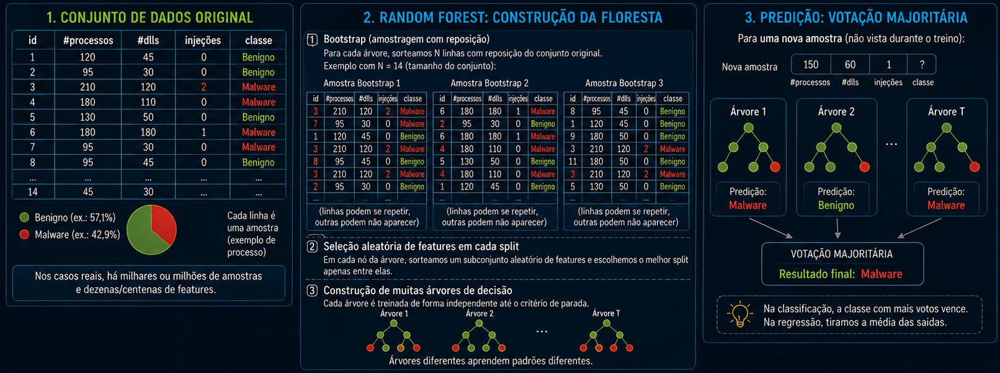

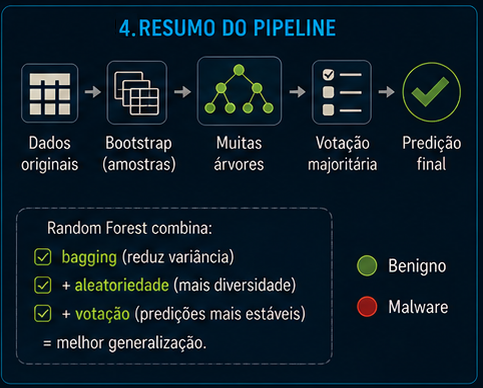

In [ ]:
# Exemplo didático com 10 observações do conjunto de treino
sample = X_train.head(10).copy()
sample["target"] = y_train.head(10).values

print("=== CONJUNTO ORIGINAL ===")
display(sample)

In [ ]:
# TODO Crie uma amostra bootstrap a usando sample
# - o número de observações deve ser igual ao conjunto original
# - sampling deve ser feito COM reposição
bootstrap_sample = sample.sample(...)

print("=== AMOSTRA BOOTSTRAP ===")
display(bootstrap_sample)

In [ ]:
# Ver quais observações apareceram mais de uma vez
print("=== QUANTIDADE DE VEZES QUE CADA OBSERVAÇÃO APARECEU ===")

counts = bootstrap_sample.index.value_counts().sort_index()

bootstrap_summary = pd.DataFrame({
    "original_index": sample.index,
    "vezes_no_bootstrap": counts.reindex(sample.index, fill_value=0)
})

display(bootstrap_summary)

In [ ]:
# TODO Inicializar e treinar o ensemble de Random Forest
# configurando:
# - n_estimators para definir o número de árvores do ensemble;
# - max_depth para limitar a profundidade máxima de cada árvore
# e ajudar a controlar o overfitting;
# - n_jobs=-1 para utilizar todos os processadores disponíveis.
rf_model = RandomForestClassifier(...)

# TODO Treine o ensemble utilizando .fit e os dados de treinamento X_train, y_train
...

# TODO Faça as previsões no conjunto de validação X_val usando predict()
# para retornar a classe prevista para cada amostra
y_pred_rf = ...

# TODO Obtenha as probabilidades previstas para cada classe usando predict_proba
# nos dados X_val e depois usando [:, 1] para selecionar a
# probabilidade da classe positiva (Malware)
y_prob_rf = ...

print("=== RANDOM FOREST PERFORMANCE (VALIDATION) ===")
print(f"Accuracy:  {accuracy_score(y_val, y_pred_rf):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_rf):.4f}")
print(f"Recall:    {recall_score(y_val, y_pred_rf):.4f}")
print(f"F1-Score:  {f1_score(y_val, y_pred_rf):.4f}")
print(f"ROC-AUC:   {roc_auc_score(y_val, y_prob_rf):.4f}")


## 8. Modelo 3: LightGBM (Ensemble por Boosting)

### Por que usar Boosting (Gradient Boosting)?
Diferente do Bagging (paralelo), o **Gradient Boosting** treina árvores de forma **sequencial**. Cada nova árvore é otimizada para aprender e corrigir os erros (resíduos) cometidos pelas árvores anteriores. O **LightGBM** utiliza crescimento *leaf-wise*, proporcionando altíssima velocidade de inferência e precisão em detecção de ameaças.


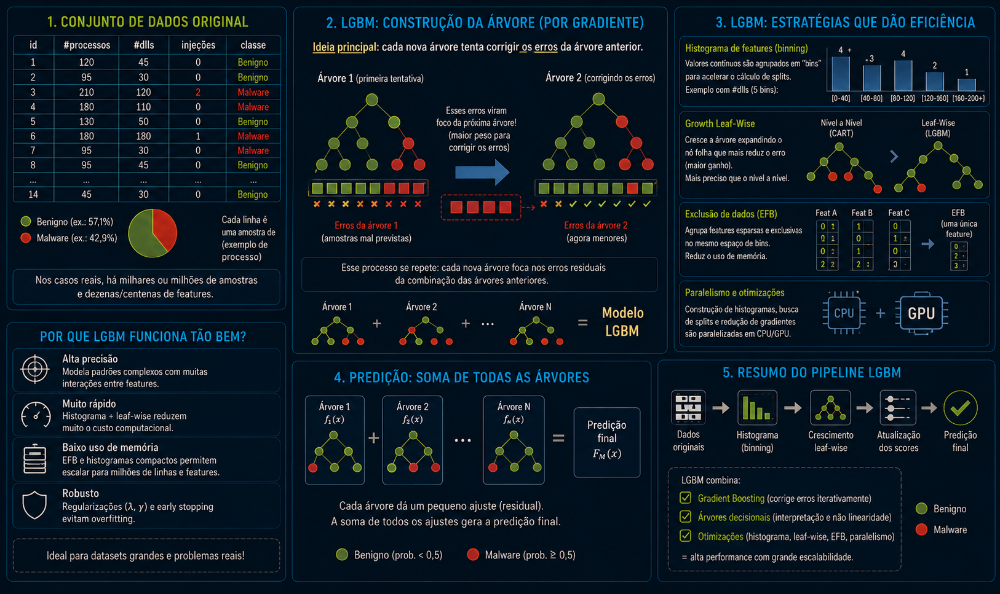

In [ ]:
# TODO Inicializar e treinar o classificador LightGBM
# configurando:
# - n_estimators para definir o número de árvores utilizadas no ensemble;
# - learning_rate para controlar o quanto cada nova árvore contribui
# para o modelo;
# - max_depth para limitar a profundidade máxima das árvores
# e ajudar a controlar o overfitting;
lgb_model = lgb.LGBMClassifier(...)

# TODO Treine o modelo utilizando .fit e os dados de treinamento X_train, y_train
...

# TODO Faça as previsões no conjunto de validação X_val usando predict()
# para retornar a classe prevista para cada amostra
y_pred_lgb = ...

# TODO Obtenha as probabilidades previstas para cada classe usando predict_proba
# nos dados X_val e depois usando [:, 1] para selecionar a
# probabilidade da classe positiva (Malware)
y_prob_lgb = ...


print("=== LIGHTGBM PERFORMANCE (VALIDATION) ===")
print(f"Accuracy:  {accuracy_score(y_val, y_pred_lgb):.4f}")
print(f"Precision: {precision_score(y_val, y_pred_lgb):.4f}")
print(f"Recall:    {recall_score(y_val, y_pred_lgb):.4f}")
print(f"F1-Score:  {f1_score(y_val, y_pred_lgb):.4f}")
print(f"ROC-AUC:   {roc_auc_score(y_val, y_prob_lgb):.4f}")


## 9. Teste Final e Comparação de Desempenho no Conjunto de Teste

Realizamos a avaliação cega e definitiva no conjunto de **Teste** (dados não vistos).

In [ ]:
def evaluate_model(model, X_test_data, y_test_data, is_rule_based=False):
    """
    Calculate performance metrics and confusion matrix elements for test evaluation.
    """
    if is_rule_based:
        preds = baseline_rule_antivirus(X_test_data)
        probs = preds
    else:
        preds = model.predict(X_test_data)
        probs = model.predict_proba(X_test_data)[:, 1]

    cm = confusion_matrix(y_test_data, preds)
    tn, fp, fn, tp = cm.ravel()

    return {
        'Acurácia': accuracy_score(y_test_data, preds),
        'Precisão': precision_score(y_test_data, preds),
        'Recall (Sensibilidade)': recall_score(y_test_data, preds),
        'F1-Score': f1_score(y_test_data, preds),
        'ROC-AUC': roc_auc_score(y_test_data, probs),
        'Falsos Positivos (FP)': fp,
        'Falsos Negativos (FN)': fn
    }

# Gather final test evaluation results
results = {
    'Heurística (Baseline)': evaluate_model(None, X_test, y_test, is_rule_based=True),
    'Árvore de Decisão': evaluate_model(dt_model, X_test, y_test),
    'Random Forest (Bagging)': evaluate_model(rf_model, X_test, y_test),
    'LightGBM (Boosting)': evaluate_model(lgb_model, X_test, y_test)
}

df_results = pd.DataFrame(results).T
df_results


#### Matriz de Confusão:
* **Falso Positivo (FP):** Software Benigno detectado como Malware (interrupção operacional).
* **Falso Negativo (FN):** Malware detectado como Benigno (vulnerabilidade grave de segurança).


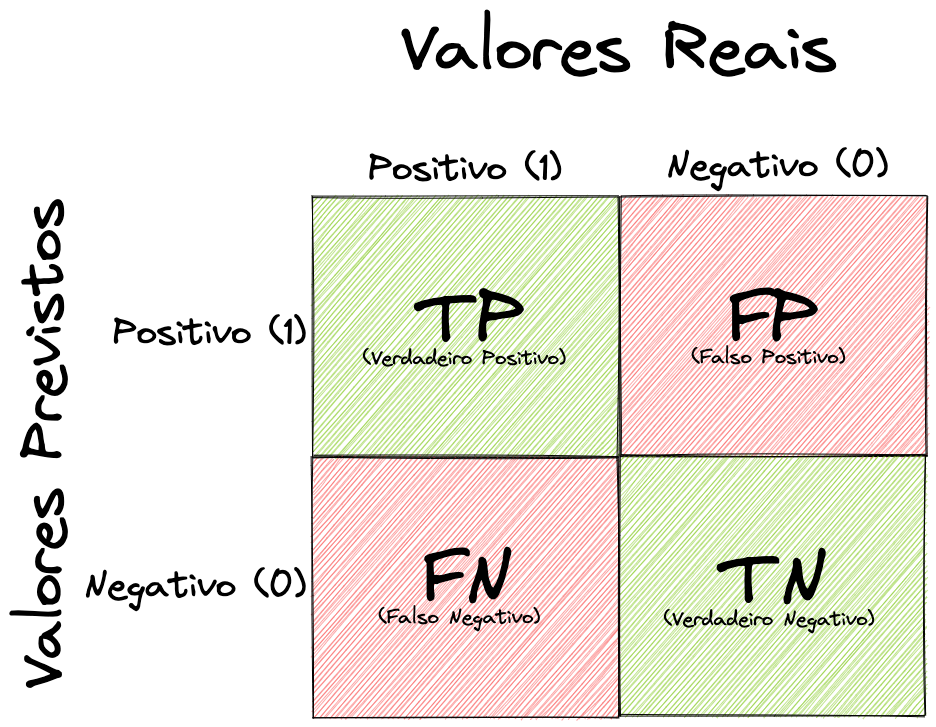

In [ ]:
# Plot comparative confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

models_list = [
    ('Árvore de Decisão', dt_model),
    ('Random Forest', rf_model),
    ('LightGBM', lgb_model)
]

for idx, (name, model) in enumerate(models_list):
    preds = model.predict(X_test)
    cm = confusion_matrix(y_test, preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[idx], cbar=False)
    axes[idx].set_title(f'Matriz de Confusão: {name}')
    axes[idx].set_xlabel('Predito (0=Benigno, 1=Malware)')
    axes[idx].set_ylabel('Real')

plt.tight_layout()
plt.show()


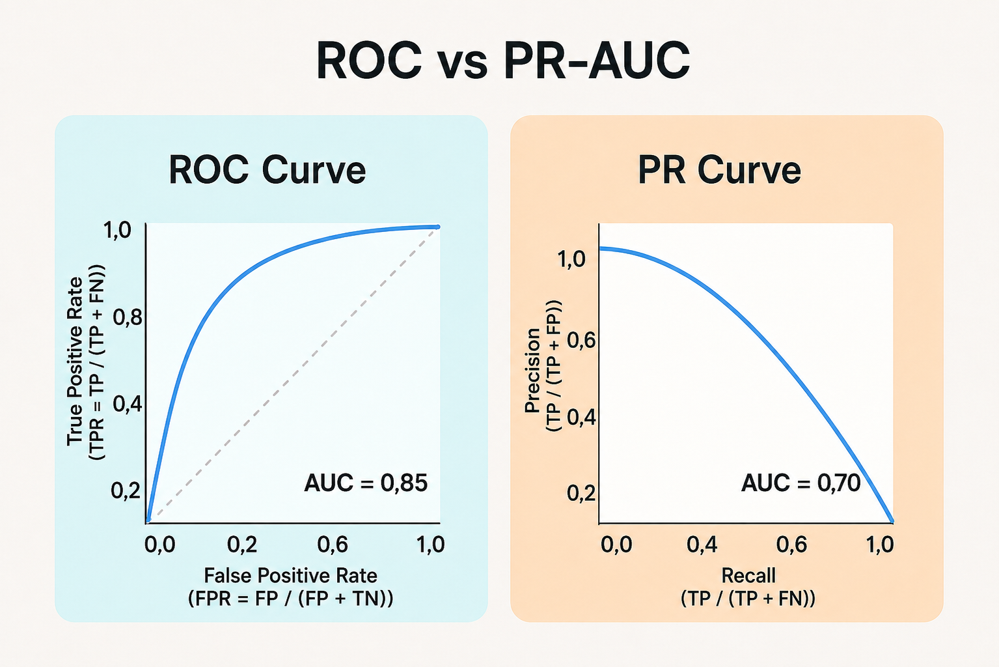

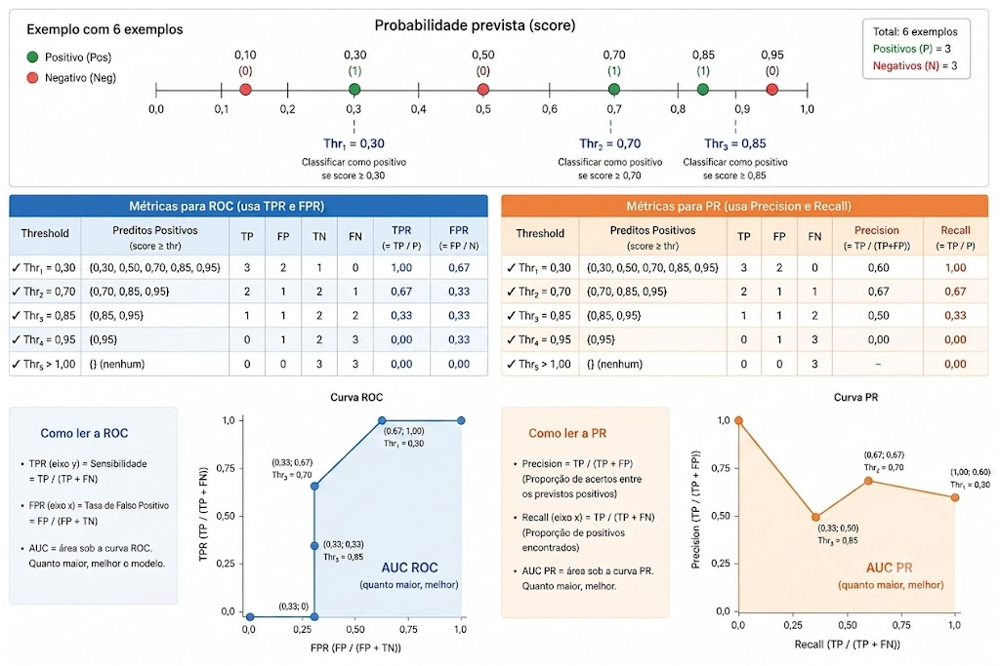

In [ ]:
# Plot comparative ROC Curves
plt.figure(figsize=(9, 6))

for name, model in models_list:
    probs = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, probs)
    auc_val = roc_auc_score(y_test, probs)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc_val:.4f})')

plt.plot([0, 1], [0, 1], 'k--', label='Classificador Aleatório')
plt.xlabel('Taxa de Falsos Positivos (FPR)')
plt.ylabel('Taxa de Verdadeiros Positivos (TPR / Recall)')
plt.title('Curva ROC Comparativa dos Antivírus de ML')
plt.legend(loc='lower right')
plt.show()


## 10. Análise de Feature Importance (O que o Antivírus Aprendeu?)

A importância de cada atributo revela quais artefatos forenses da memória RAM são mais determinantes na identificação do comportamento malicioso.


In [ ]:
# Compare feature importances across models
df_importance = pd.DataFrame({
    'Feature': X.columns,
    'Decision Tree': dt_model.feature_importances_,
    'Random Forest': rf_model.feature_importances_,
    'LightGBM': lgb_model.feature_importances_ / lgb_model.feature_importances_.sum()
})

# Sort by LightGBM importance
df_importance = df_importance.sort_values(by='LightGBM', ascending=False)

# Plot top 10 important features
plt.figure(figsize=(12, 6))
df_melted = pd.melt(df_importance.head(10), id_vars=['Feature'], var_name='Algoritmo', value_name='Importância')
sns.barplot(data=df_melted, x='Importância', y='Feature', hue='Algoritmo', palette='magma')
plt.title('Top 10 Artefatos Forenses de Memória Mais Relevantes')
plt.xlabel('Importância Relativa')
plt.ylabel('Feature Volatility')
plt.show()


## 11. Conclusões e Discussão Acadêmica

### Principais Aprendizados:
1. **Limitação de Regras Heurísticas:** Regras simples não capturam comportamentos complexos de malware ofuscado, gerando altas taxas de erro (especialmente Falsos Negativos).
2. **Bagging vs. Boosting:**
   - O **Random Forest (Bagging)** reduz variância e estabiliza previsões contra ruídos nos logs de memória.
   - O **LightGBM (Boosting)** foca sequencialmente nas amostras difíceis, atingindo os menores níveis de Falsos Negativos sem comprometer o tempo de resposta.
